# VNS 22 Project
## How good have we been at spotting the interesting details of the marvelous castle with an impossible to pronounce name ?

#### --- Notebook keeping ---
* created : 2022-08-18
* author : @hugoladret
* python.__version__ : 3.8.1
* libs : updated
#### --- Notebook keeping ---

### Imports

In [1]:
import os # OS processes
import numpy as np # array-based computations
import matplotlib.pyplot as plt # plotting library
import pandas as pd # reading the excel files
from lmfit import Model, Parameters # fitting library, for the psychometric functions
from PIL import Image # loading images 
from PIL.ImageOps import exif_transpose # rotating the image according to the camera's orientation
from tqdm import tqdm # progressbars

### Loading the pictures

### Spoilers ahead : the answers

In [2]:
idxs = np.arange(0, 40) # indices of the pictures
values = np.zeros_like(idxs) # will contain 0 for rauischholzhausen, 1 for non-rauischholzhausen
non_rauisch_idxs = [6, 7, 8, 9, 10, 12, 13, 22, 24, 25, 29, 30, 31, 32, 34, 37, 39] # this are the photos outside of the summer school
values[non_rauisch_idxs] = 1 # and we set their values to 1 in the array

### Loading the pictures

In [3]:
imgs = []

# looping through the array, adding each picture in the proper order
for i in tqdm(idxs, desc = 'Loading images...') :
    img_path = './photos/%s.jpg' % i
    imgs.append(exif_transpose(Image.open(img_path)))

Loading images...: 100%|███████████████████████████████████████████████████████████████| 40/40 [00:07<00:00,  5.52it/s]


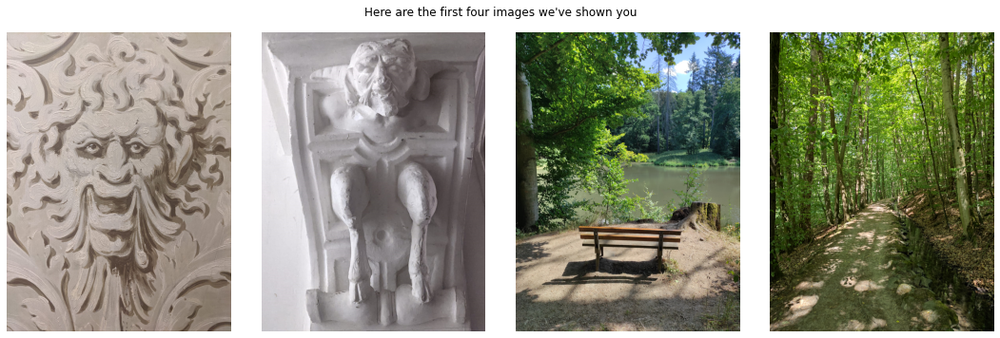

In [4]:
fig, axs = plt.subplots(figsize = (15,5), ncols = 4)
for iax, ax in enumerate(axs) :
    ax.imshow(imgs[iax])
    ax.axis('off')
fig.suptitle('Here are the first four images we\'ve shown you')
fig.tight_layout()
plt.show()

### Loading the participants answers

In [5]:
answer_file = pd.read_csv('./answers.csv', header = 0,
                         encoding = 'unicode_escape')
answer_file.head()

,Horodateur,What's your name ? (extra points if you come up with a funny nickname),Ready ?,Quizz starts ! Picture #1,Picture #2,Picture #3,Picture #4,Picture #5,Picture #6,Picture #7,...,Picture #32,Picture #33,Picture #34,Picture #35,Picture #36,Picture #37,Picture #38,Picture #39,Picture #40,You made it !! Congrats !!!
0,18/08/2022 09:57:12,test_remove_me,"Yes, but on this button",Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Anywhere else,...,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Send me your best meme at hugo(dot)ladret(at)g...
1,18/08/2022 10:16:00,PI,"Yes, but on this button",Rauischholzhausen castle,Anywhere else,Anywhere else,Rauischholzhausen castle,Anywhere else,Anywhere else,Anywhere else,...,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Anywhere else,Anywhere else,Option 3
2,18/08/2022 10:17:45,Hanna the amazing,Yes,Rauischholzhausen castle,Anywhere else,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,...,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Send me your best meme at hugo(dot)ladret(at)g...
3,18/08/2022 20:19:04,Junhao,Yes,Anywhere else,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Anywhere else,...,Anywhere else,Anywhere else,Rauischholzhausen castle,Anywhere else,Anywhere else,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Anywhere else,Option 3
4,18/08/2022 20:19:00,Jan,Yes,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,...,Anywhere else,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Rauischholzhausen castle,Anywhere else,Rauischholzhausen castle,Rauischholzhausen castle,Send me your best meme at hugo(dot)ladret(at)g...


In [6]:
answer_array = np.zeros((len(imgs), len(answer_file))) # we create an array of shape N participants x N pictures

for i_img in range(len(imgs)) :
    if i_img == 0 : # shouldn't have changed the name for picture #1
        answer_col = answer_file['Quizz starts ! Picture #%s' % (i_img+1)]
    else :
        answer_col = answer_file['Picture #%s' % (i_img+1)]
    
    # Converting into an array to simplify the script down the line
    answer_col = np.asarray(answer_col)
    answer_col[answer_col == 'Rauischholzhausen castle'] = 0
    answer_col[answer_col !=0] = 1
    
    answer_array[i_img,:] = answer_col

# Now the interesting part !
## For each image, the proportion correct and wrong

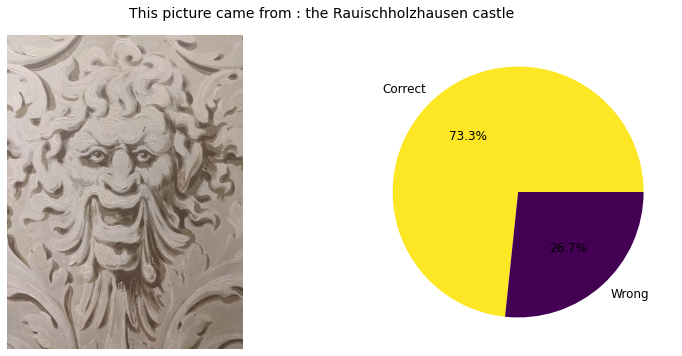

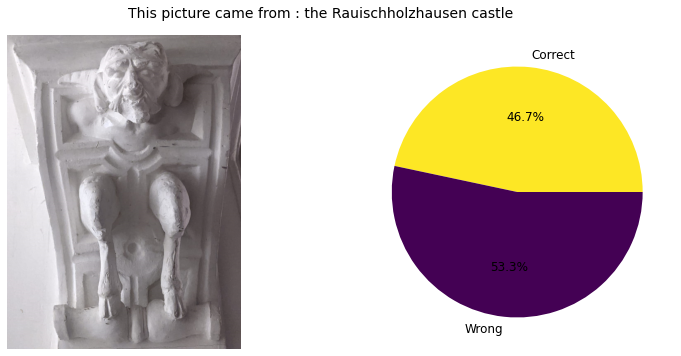

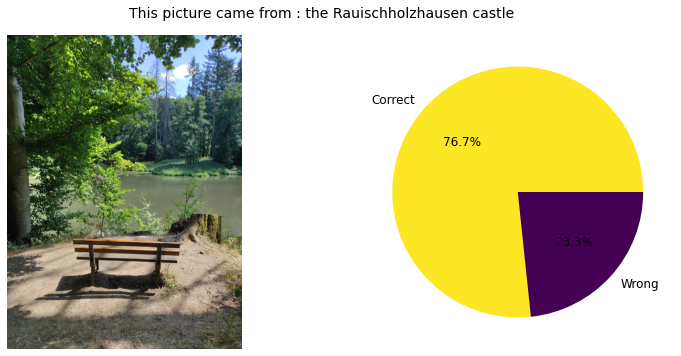

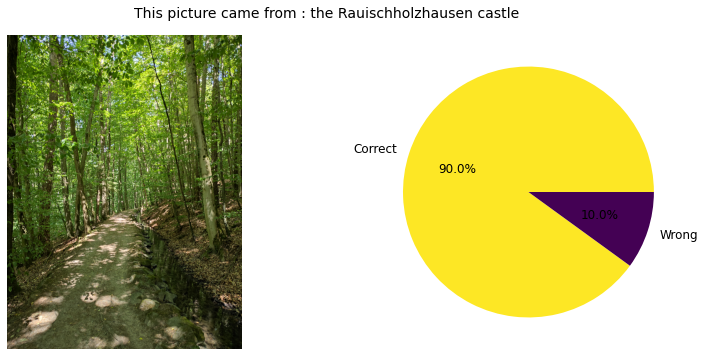

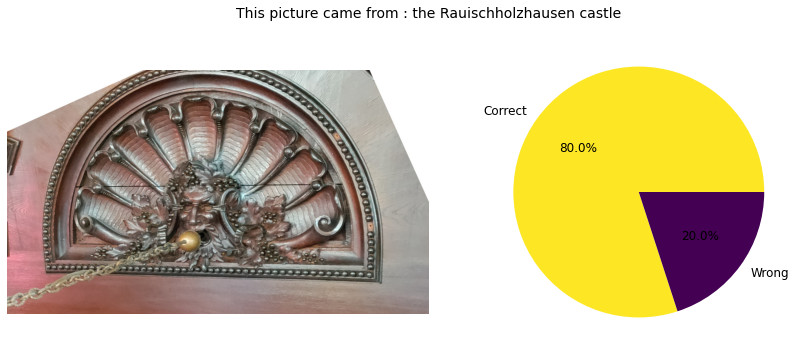

...

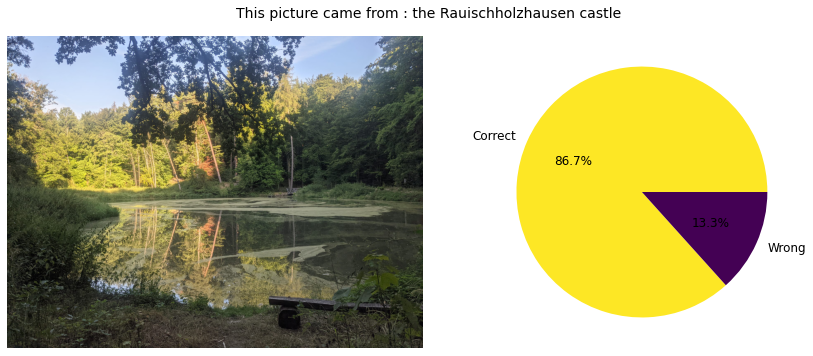

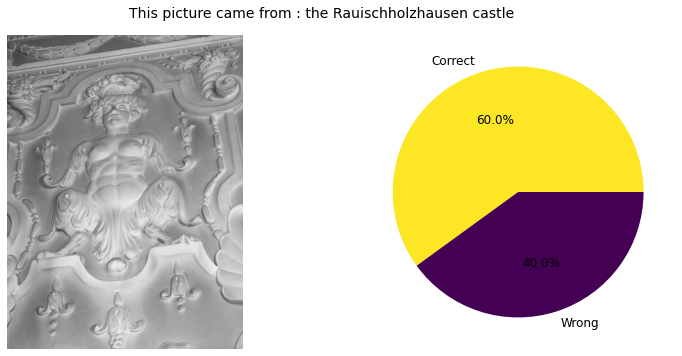

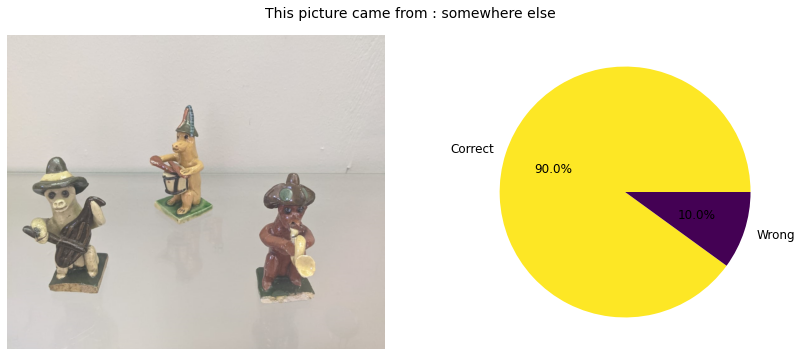

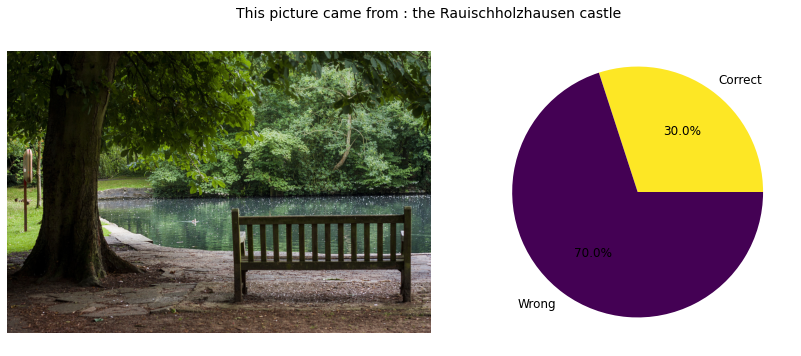

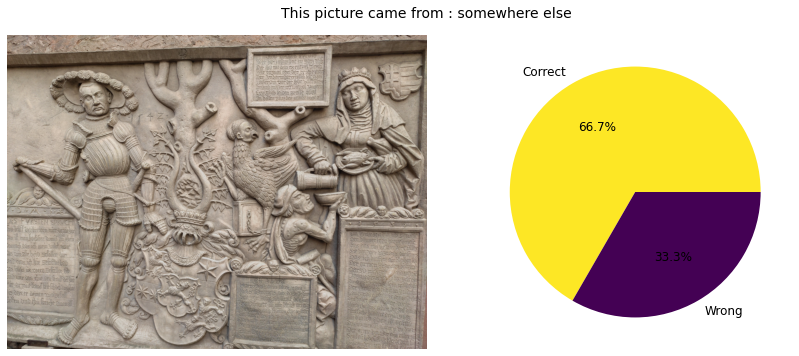

In [15]:
all_prop_correct = []
for i_img in range(len(imgs)) :
    correct_answer = values[i_img]
    
    prop_correct = len(np.where(answer_array[i_img,:] == correct_answer)[0])
    prop_correct /= len(answer_array[i_img,:])
    prop_wrong = 1 - prop_correct
    all_prop_correct.append(prop_correct)
    
    fig, axs = plt.subplots(figsize = (12,5), ncols = 2)
    fig.suptitle('This picture came from : %s' % ('the Rauischholzhausen castle' if correct_answer == 0 else 'somewhere else'),
                fontsize = 14)
    
    axs[0].imshow(imgs[i_img])
    axs[0].axis('off')
    
    axs[1].pie([prop_correct, prop_wrong], autopct='%1.1f%%', labels = ['Correct', 'Wrong'], 
               colors = plt.cm.viridis(np.linspace(1, 0, 2)), textprops={'fontsize':'12'})
    
    fig.tight_layout()
    plt.show()

In [8]:
all_prop_correct

[0.7333333333333333,
 0.4666666666666667,
 0.7666666666666667,
 0.9,
 0.8,
 0.8666666666666667,
 0.7333333333333333,
 0.9,
 0.8333333333333334,
 0.43333333333333335,
 0.8333333333333334,
 0.8666666666666667,
 0.4,
 0.9,
 0.5,
 0.6666666666666666,
 0.8666666666666667,
 0.4666666666666667,
 0.9,
 0.9,
 0.6666666666666666,
 0.8333333333333334,
 0.8666666666666667,
 0.8666666666666667,
 0.6333333333333333,
 0.36666666666666664,
 0.6333333333333333,
 0.5,
 0.8,
 0.8333333333333334,
 0.4,
 0.8,
 0.6666666666666666,
 0.7,
 0.5,
 0.8666666666666667,
 0.6,
 0.9,
 0.3,
 0.6666666666666666]

## Plotting that on an arbitrary axis, which is the order in which we showed the images to you

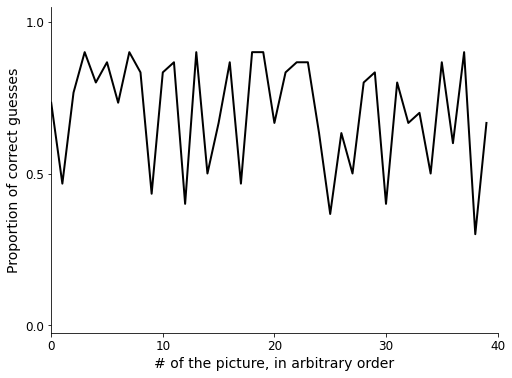

In [9]:
fig, ax = plt.subplots(figsize=(8,6))

ax.plot(idxs, all_prop_correct, c = 'k', linewidth = 2)
ax.set_ylim(-0.025, 1.05)
ax.set_xlim(0, len(idxs))

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_yticks([0, .5, 1.])
ax.set_xticks([0, 10, 20, 30, 40])
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('# of the picture, in arbitrary order', fontsize = 14)
ax.set_ylabel('Proportion of correct guesses', fontsize = 14)
plt.show()

# Well that's not exactly a psychometric function as we've seen in class, but then again the X axis is completely arbitrary
![example of psychometric function](./misc/psycho_func_wikipedia.png)
## What if we re-order the data point to make it look more like a step-like non-linear function

In [10]:
reordered_answers, reordered_idxs = zip(*sorted(zip(all_prop_correct, idxs)))

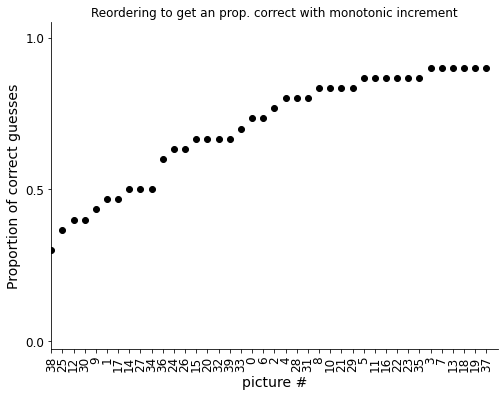

In [11]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(np.arange(0, 40), reordered_answers, c = 'k')
ax.set_ylim(-0.025, 1.05)
ax.set_xlim(0, len(idxs))

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_yticks([0, .5, 1.])
ax.set_xticks(np.arange(0, 40))
plt.xticks(rotation = 90)
ax.set_xticklabels(reordered_idxs)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('picture #', fontsize = 14)
ax.set_ylabel('Proportion of correct guesses', fontsize = 14)
ax.set_title('Reordering to get an prop. correct with monotonic increment')
plt.show()

## That's better, maybe we can fit it with a psychometric curve ? 
### We'll use a Naka-Rushton function because a) it describes nicely contrast-response function b) it's late and I already have the code from another paper

In [12]:
def nakarushton(x, rmax, c50, b, n):
    nkr = b + (rmax-b) * ((x**n) / (x**n + c50**n))
    return nkr

def fit_nkr(array) :
    x = np.linspace(0, 1, len(array))
    y = array[::-1]
    
    mod = Model(nakarushton)
    pars = Parameters()
    
    pars.add_many(('rmax',  np.max(y), True,  0.0,  200.),
              ('c50', .5, True,  0.001, 10.),
              ('b', y[0], True, y[0] * .5 + .001, y[0] * 3 + .002 ),
              ('n', 5., True,  1., 250.))
    
    out = mod.fit(y, pars, x=x, nan_policy='omit', max_nfev = 2000)
    return out.best_values, np.abs(1-out.residual.var() / np.var(y))

In [13]:
fitted_nkr = fit_nkr(np.asarray(reordered_answers))
print('Naka-Ruhston parameters :')
print(fitted_nkr[0])
print('R^2 : %.3f' % fitted_nkr[1])

Naka-Ruhston parameters :
{'rmax': 1.342914668356343e-09, 'c50': 0.8811067577782221, 'b': 0.8844584475995871, 'n': 3.2634883305365583}
R^2 : 0.987


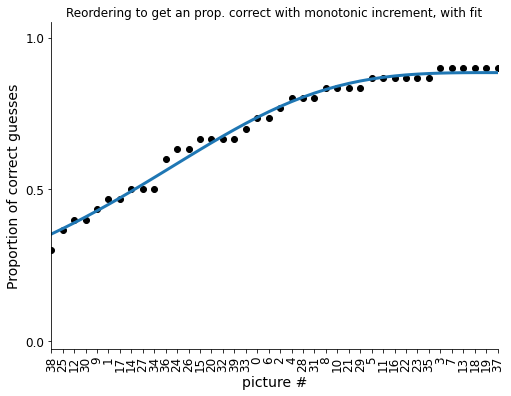

In [14]:
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(np.linspace(0, 1, 40), reordered_answers, c = 'k')
ax.plot(np.linspace(0,1,40),
        nakarushton(np.linspace(0,1,40), **fitted_nkr[0])[::-1],
       linewidth = 3)
ax.set_ylim(-0.025, 1.05)
ax.set_xlim(0, 1.)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_yticks([0, .5, 1.])
ax.set_xticks(np.linspace(0, 1, 40))
plt.xticks(rotation = 90)
ax.set_xticklabels(reordered_idxs)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel('picture #', fontsize = 14)
ax.set_ylabel('Proportion of correct guesses', fontsize = 14)

ax.set_title('Reordering to get an prop. correct with monotonic increment, with fit')
plt.show()

## But this is a random axis, is there any way we could account for why would we want the images to be ordered like this ?
## One could look at mean luminance, contrast, colours, semantic content...

#### At this point Hugo felt like he took this project way too seriously and stopped coding
#### Refresh the github repo in a few days to look for any updates !